<a href="https://colab.research.google.com/github/mchuffman/stem-camp-notebooks/blob/master/Tiger.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Pick an Image

Pick from a few choices by uncommenting the relevant URL or provide your own image (accepts color images). That image is loaded for analysis as a greyscale image. 
>Default is a tiger

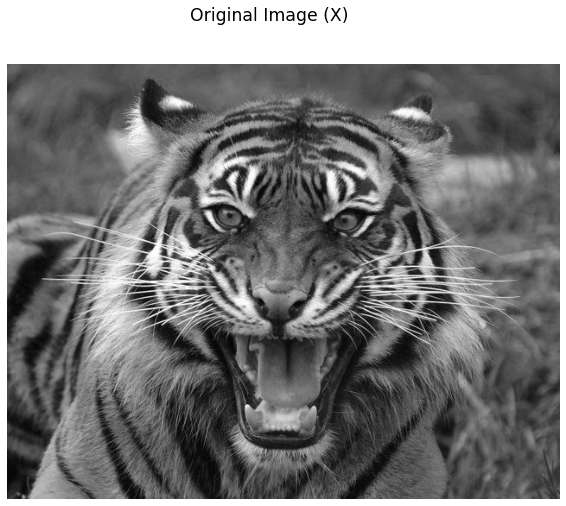

This photo is (504, 640)
max inner dimension (r) = 504


In [ ]:
#@title
#Some Libraries
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
import os
plt.rcParams['figure.figsize'] = [16, 8]

from PIL import Image
import requests

# Tiger image:
A = Image.open(requests.get("https://i.pinimg.com/originals/21/bb/ca/21bbcacadd8bb6a9bf465dc29988da3d.jpg", stream=True).raw)

#Bird image
# A = Image.open(requests.get("https://i.pinimg.com/originals/5a/a0/09/5aa009bf66a518b61048034d81286244.jpg", stream = True,).raw)

#Octopus Image
# A = Image.open(requests.get("https://wallsdesk.com/wp-content/uploads/2017/01/Octopus-High-Definition-Wallpapers-.jpg", stream = True).raw)

 # Convert RGB to grayscale
X = np.mean(A, -1); # Convert RGB to grayscale

 # Show selected image


img = plt.imshow(X)
img.set_cmap('gray')
plt.axis('off')
plt.axis('off')
plt.suptitle('Original Image (X)', fontsize = 'xx-large')
plt.title("")
plt.show()
plt.show()

#Show the photo's resolution
print("This photo is " + str(X.shape))

# Making a note of the rank of any "Full Rank" approximations

if X.shape[0] <= X.shape[1]:
    full_rank = X.shape[0]
else:
  full_rank = X.shape[1]

print("max inner dimension (r) = " + str(full_rank))

## I. SVD on an Image

Ok, lets start with SVD. The inner matrix dimensions are fixed in SVD so there's no decision to be made there. After peforming a full SVD of the image, we'll consider some partial reconstructions, consider the variance or "energetic contributions" of each eigentriple (via $ \sigma $) and then consider the energetic contribution to the original image. 


### I. (a) Run SVD

In [ ]:
#@title
#SVD
U, S, VT = np.linalg.svd(X,full_matrices=False)
S = np.diag(S)

print("SVD Completed")


SVD Completed


### I. (b) Full Rank Reproduction:
Lets take a look at the Fullrank SVD reproduction of the original image

><p> $ \tilde{X} = U\Sigma V^{T} $   <p>

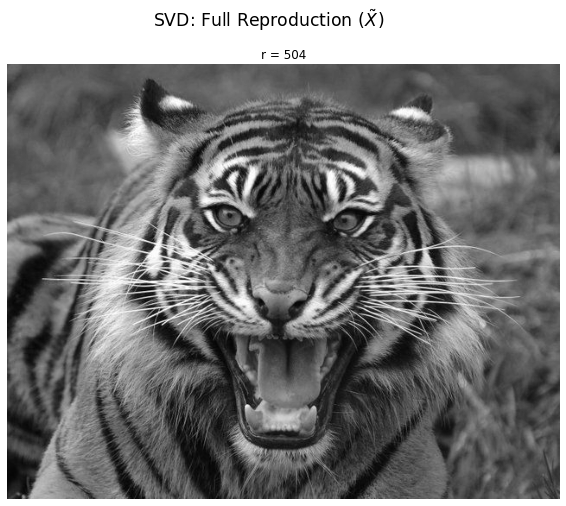

In [ ]:
#@title
#Full rank Reproduction
Reproduced_SVD = U@S@VT


img = plt.imshow(Reproduced_SVD)
img.set_cmap('gray')
plt.axis('off')
plt.suptitle('SVD: Full Reproduction $ (\~X) $', fontsize = 'xx-large')
plt.title('r = ' + str(full_rank))
plt.show()

### Error Matrix



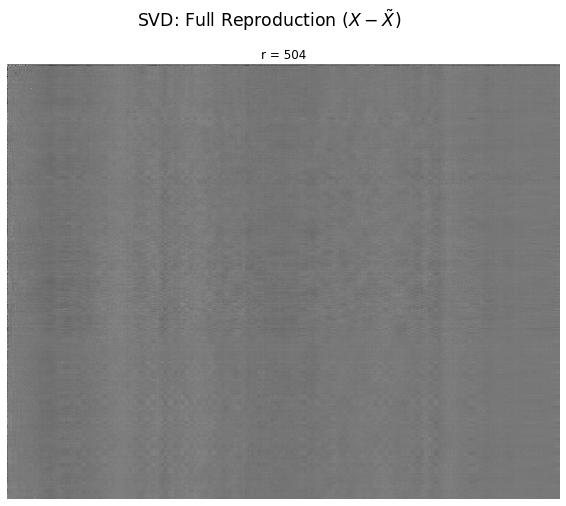

In [ ]:
#@title
#Full rank Reproduction

img = plt.imshow(X-Reproduced_SVD)
img.set_cmap('gray')
plt.axis('off')
plt.suptitle('SVD: Full Reproduction $ (X - \~X) $', fontsize = 'xx-large')
plt.title('r = ' + str(full_rank))
plt.show()

### (b) A few Low Rank representations of Original Image (X)
>$\sum_{i}^{r}U_{i}\Sigma_{i} V^{T}_{i}, r\epsilon \left \{ 1, 2, 5, 20, 100 \right \} $

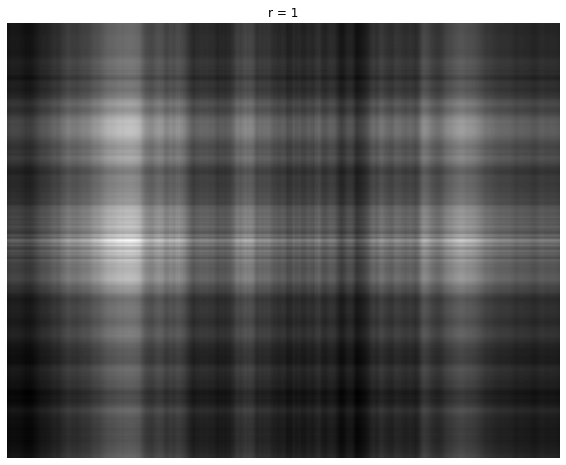

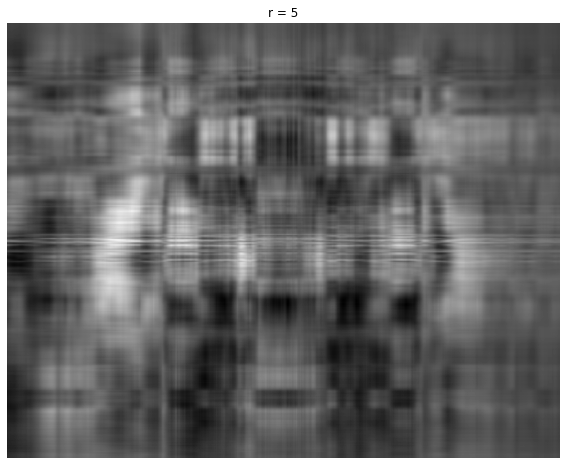

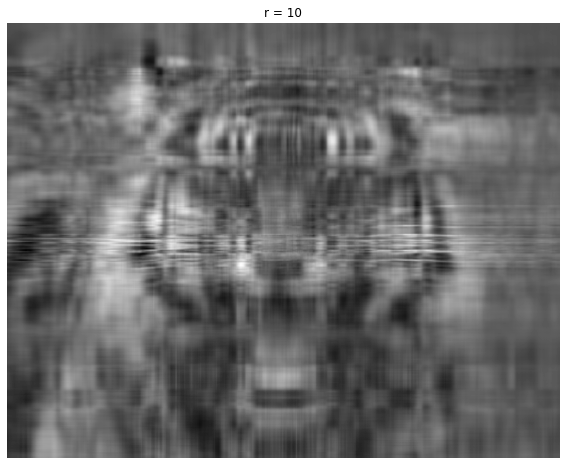

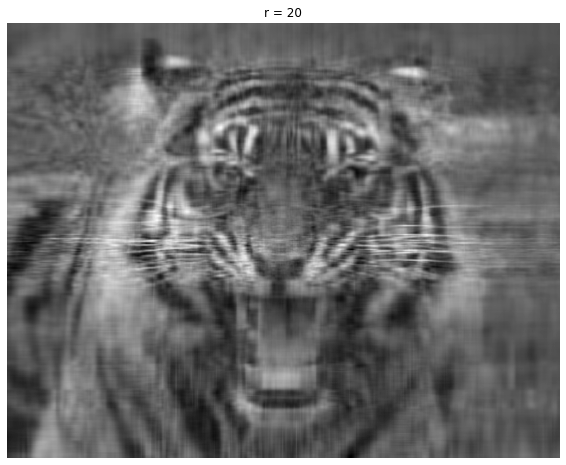

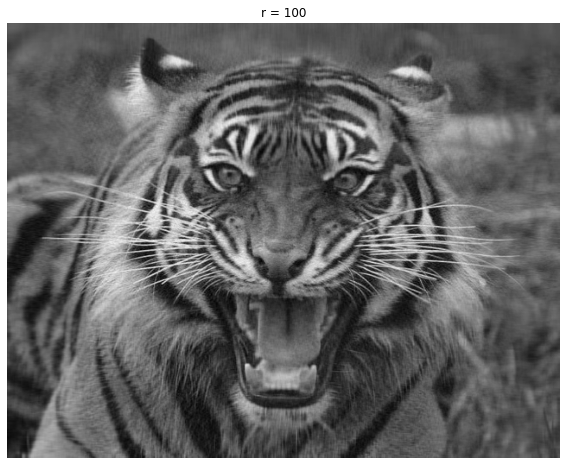

In [ ]:
#@title

j = 0
for r in (1, 5, 10, 20, 100):
    # Construct approximate image
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    # plt.suptitle('$\sum_{i}^{r}U_{i}\Sigma_{i} V^{T}_{i} $', fontsize = 'xx-large')
    plt.title('r = ' + str( r  ))
    plt.show()

### **I. (d) The error matrices (and corresponding images) of the above low-rank representations**

>$ E = X - U_{r}\Sigma_{r} V^{T}_{r} $

(Generally, the goal is an error matrix with guassian entries)

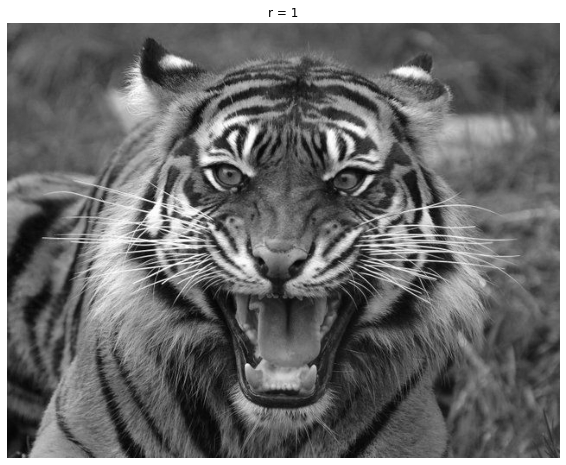

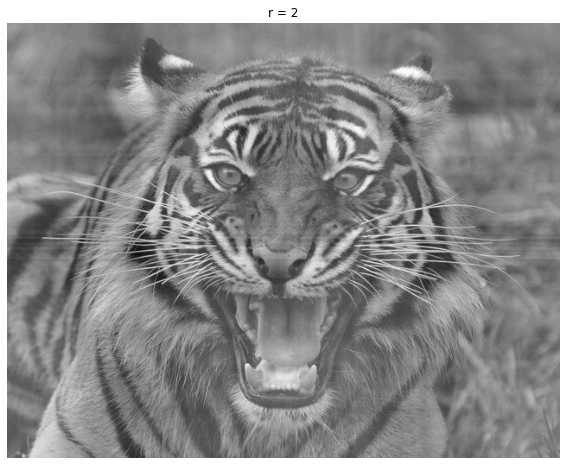

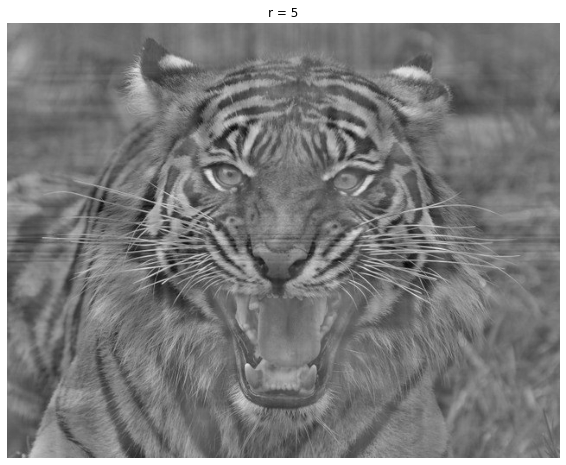

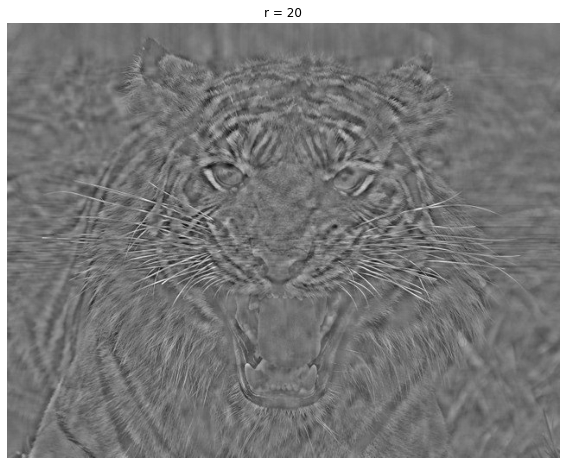

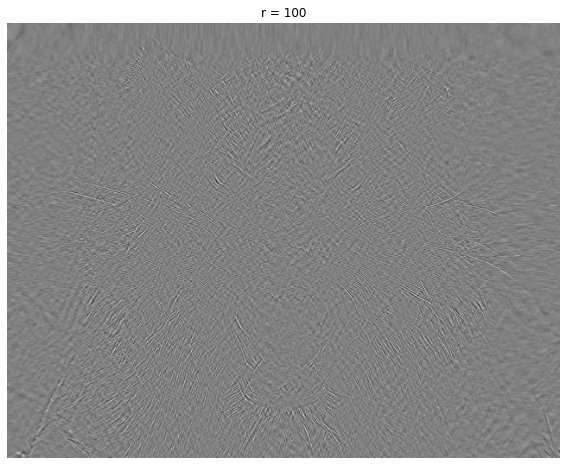

In [ ]:
#@title

j = 0
for r in (0, 1, 4, 19, 99):
    # Construct approximate image
    Xapprox = U[:,:r] @ S[0:r,:r] @ VT[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(X - Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    # plt.suptitle('$\sum_{i}^{r}U_{i}\Sigma_{i} V^{T}_{i} $', fontsize = 'xx-large')
    plt.title('r = ' + str( r + 1 ))
    plt.show()

### I (c). Energetic Cumulative Distribution
>$\frac{\sum_{i}^{r}\sigma_{i }^{2}}{\sum_{i}^{n}\sigma_{i }^{2}}$ vs r

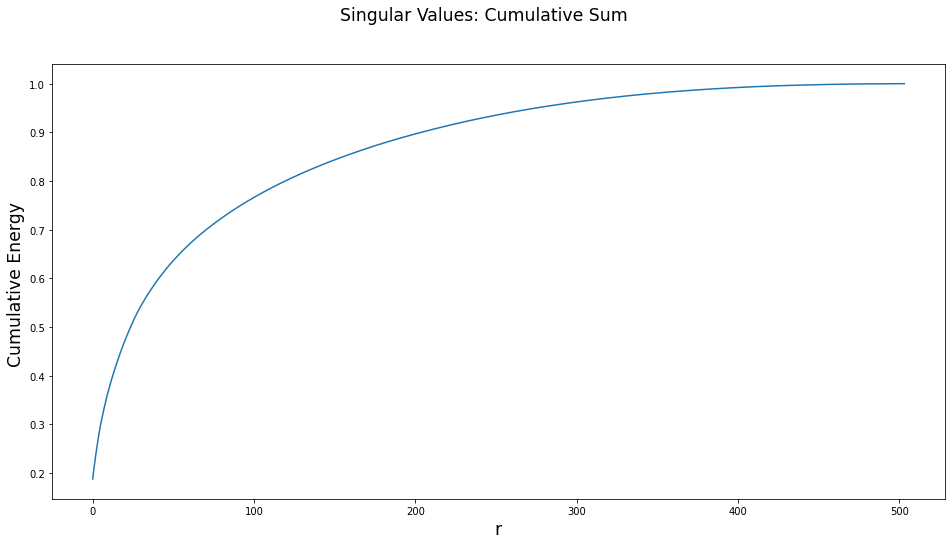

In [ ]:
#@title

#Cumulative 
plt.figure(2)
plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)))
plt.suptitle('Singular Values: Cumulative Sum', fontsize = 'xx-large')
plt.xlabel("r", fontsize = 'xx-large')
plt.ylabel("Cumulative Energy ", fontsize = 'xx-large')
# plt.title('r = ' + str(full_rank))
# plt.title("r")
plt.show()



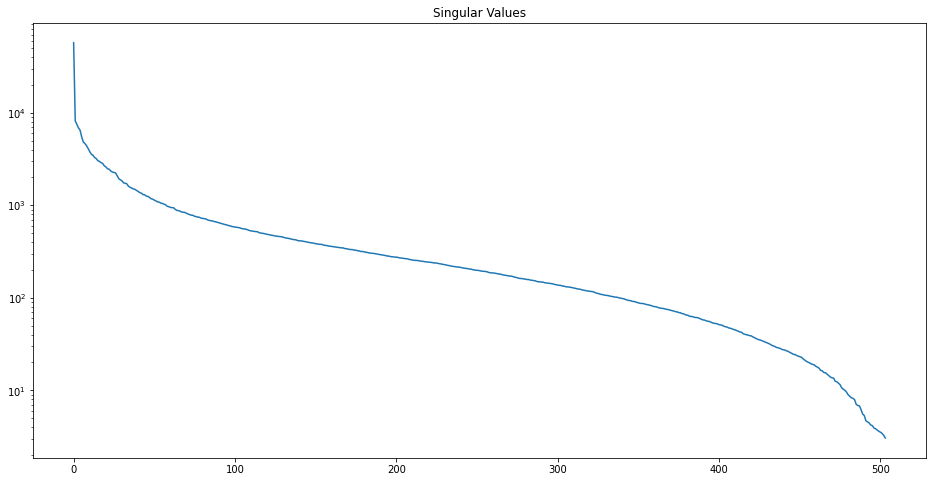

In [ ]:
#@title
## f_ch01_ex02_2

plt.figure(1)
plt.semilogy(np.diag(S))
plt.title('Singular Values')
plt.show()

# plt.figure(2)
# plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)))
# plt.suptitle('Singular Values: Cumulative Sum', fontsize = 'xx-large')
# plt.xlabel("r", fontsize = 'xx-large')
# plt.ylabel("r", fontsize = 'xx-large')
# # plt.title('r = ' + str(full_rank))
# # plt.title("r")
# plt.show()


## II. NMF of an Image

Start with some helpful functions

In [ ]:
#@title
from sklearn.decomposition import NMF
import time

def loss_fro(v, w, h):
    return np.linalg.norm(v-w@h, ord ='fro')

def SklearnNMF(A, k, solver_mode = 'cd', init_mode = 'random', maxiters = 500):
    model = NMF(n_components = k, 
                init = init_mode, 
                solver = solver_mode,
                max_iter = maxiters,
                random_state = 0)
    W = model.fit_transform(A)
    H = model.components_
    return W, H

### I (a). NMF: Low Rank Image Compression 

In [ ]:
k = 25

#### Find Optimal Solver Modes and Perform Factorization 
This is commented out. Ran one time to determine which solver/initialize mode gave the best performance. 



In [ ]:
#@title
# ## SK Learn tests
# solver_modes = ['cd', 'mu']
# init_modes = ['random', 'nndsvd', 'nndsvda', 'nndsvdar']
        
# SklearnLogs = []
# Sk_TimeLogs = []

# k = 20

# for solver in solver_modes:
#     for init in init_modes:
#         tic = time.time()
#         Wtest, Htest = SklearnNMF(X, k, solver_mode = solver, init_mode = init)
#         toc = time.time()
        
#         SklearnLogs.append(loss_fro(X, Wtest, Htest))
#         Sk_TimeLogs.append(toc - tic)
        
# res = [i for i, j in enumerate(SklearnLogs) if j == min(SklearnLogs)]

# NMF_modes = []
# for solver in solver_modes:
#     for init in init_modes:
#         NMF_modes.append((solver, init))

# # print(res)
# # Printing result
# print("Best results obtained by : " + str(NMF_modes[res[0]]))
# print('Norm of '+ str(SklearnLogs[res[0]]))


        
# Wtest, Htest = SklearnNMF(X, k, solver_mode = NMF_modes[res[0]][0], init_mode = NMF_modes[res[0]][1])

In [ ]:
"""
Tiger:
Best results obtained by : ('cd', 'nndsvdar')
Norm of 12869.327699993468
"""

"\nTiger:\nBest results obtained by : ('cd', 'nndsvdar')\nNorm of 12869.327699993468\n"

#### Run NMF

In [ ]:
#@title
Wtest_low, Htest_low = SklearnNMF(X, k, solver_mode = 'cd', init_mode = 'nndsvdar')

#### Low Rank Reconstructions of Original Image
>$\sum_{i}^{r}W_{i}H_{i}, r\epsilon \left \{ 1, 2, 5, 10, 20 \right \} $

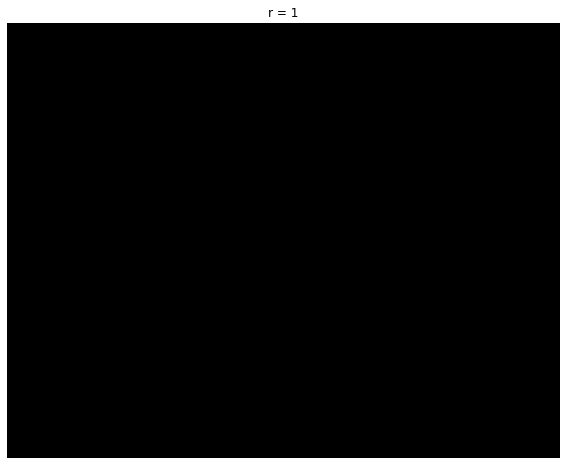

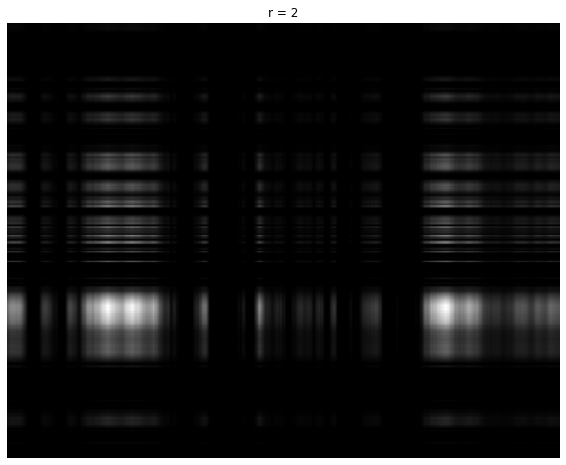

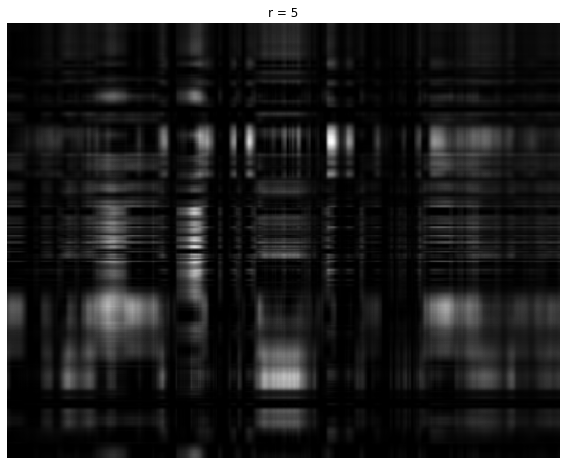

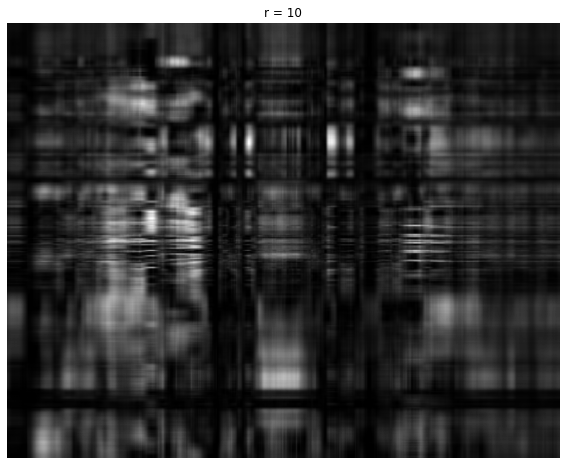

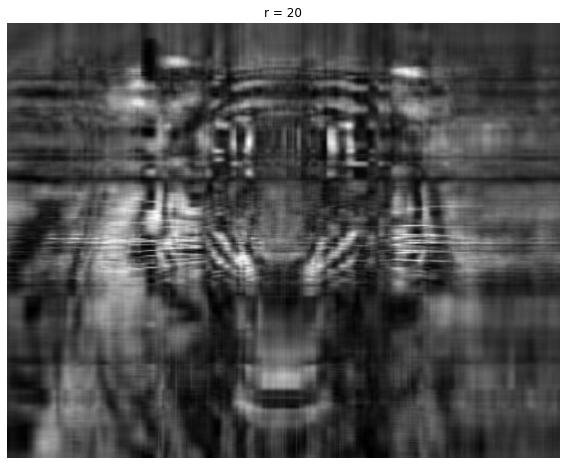

In [ ]:
#@title
for r in (0, 1, 4, 9, 19):
    # Construct approximate image
    Xapprox = Wtest_low[:,:r] @ Htest_low[:r,:]
  
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r+1))
    plt.show()

Error Matrices for Low Rank Approx

Again, this is what we're leaving behind

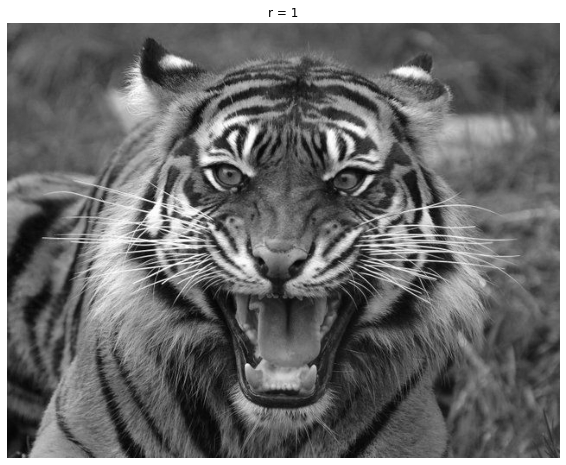

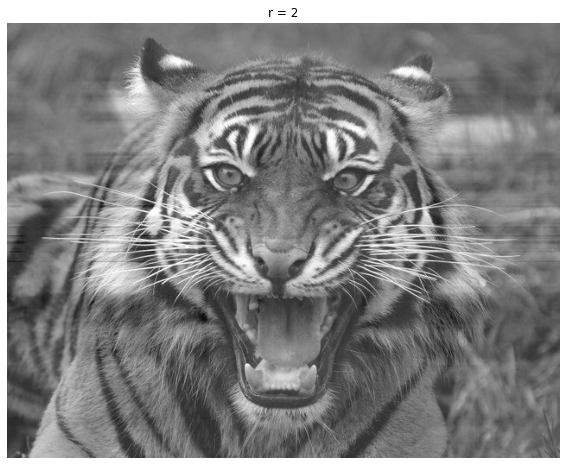

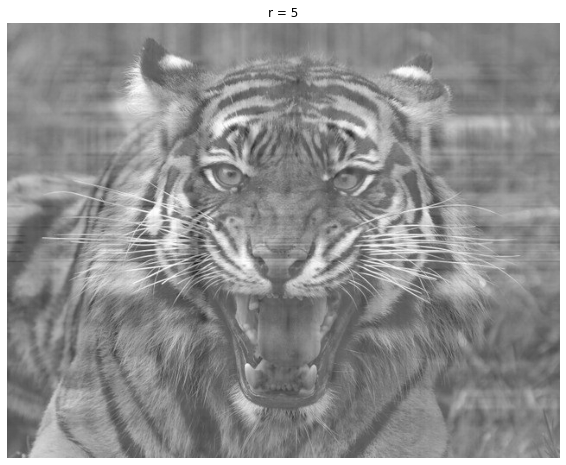

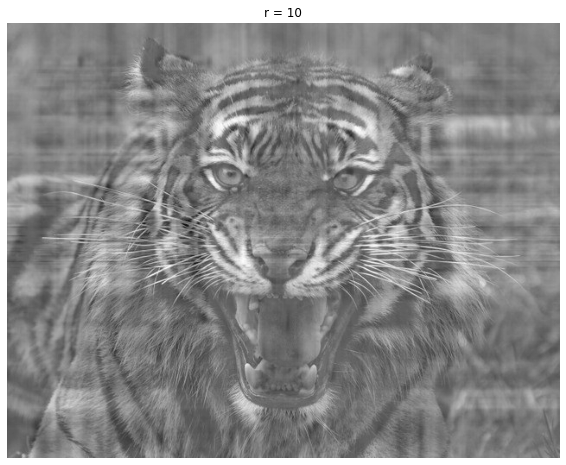

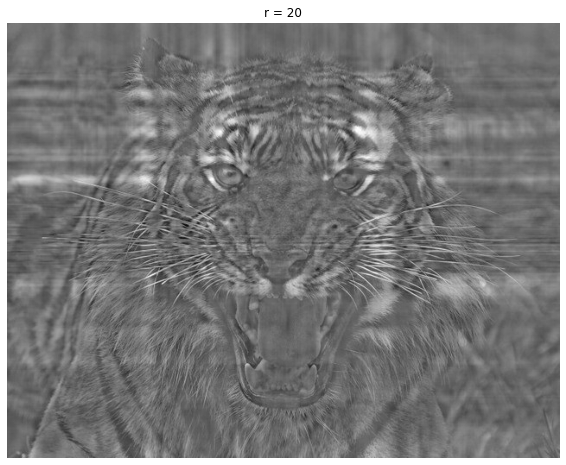

In [ ]:
#@title
for r in (0, 1, 4, 9, 19):
    # Construct approximate image
    Xapprox = Wtest_low[:,:r] @ Htest_low[:r,:]
  
    img = plt.imshow(X - Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r+1))
    plt.show()

### II (b). NMF: Higher Rank Compressions



#### Find Optimal Solver Modes and Perform Factorization 
This is commented out. Ran one time to determine which solver/initialize mode gave the best performance. 

In [ ]:
#@title
# ## SK Learn tests
# solver_modes = ['cd', 'mu']
# init_modes = ['random', 'nndsvd', 'nndsvda', 'nndsvdar']
        
# SklearnLogs = []
# Sk_TimeLogs = []

# k = 250

# for solver in solver_modes:
#     for init in init_modes:
#         tic = time.time()
#         Wtest, Htest = SklearnNMF(X, k, solver_mode = solver, init_mode = init)
#         toc = time.time()
        
#         SklearnLogs.append(loss_fro(X, Wtest, Htest))
#         Sk_TimeLogs.append(toc - tic)

# res = [i for i, j in enumerate(SklearnLogs) if j == min(SklearnLogs)]

# NMF_modes = []
# for solver in solver_modes:
#     for init in init_modes:
#         NMF_modes.append((solver, init))

# # print(res)
# # Printing result
# print("Best results obtained by : " + str(NMF_modes[res[0]]))
# print('Norm of '+ str(SklearnLogs[res[0]]))

# Wtest, Htest = SklearnNMF(X, k, solver_mode = NMF_modes[res[0]][0], init_mode = NMF_modes[res[0]][1])

In [ ]:
"""
Best results obtained by : ('cd', 'nndsvd')
Norm of 8393.620003834012
"""

#### Run NMF on a quarter of full rank

In [ ]:
#@title

k_medrank_nmf = int(full_rank/4)
Wtest_fullNMF, Htest_fullNMF = SklearnNMF(X, k_medrank_nmf, solver_mode = "cd", init_mode = 'nndsvd')
print ('k = '+ str(k_medrank_nmf))

k = 126


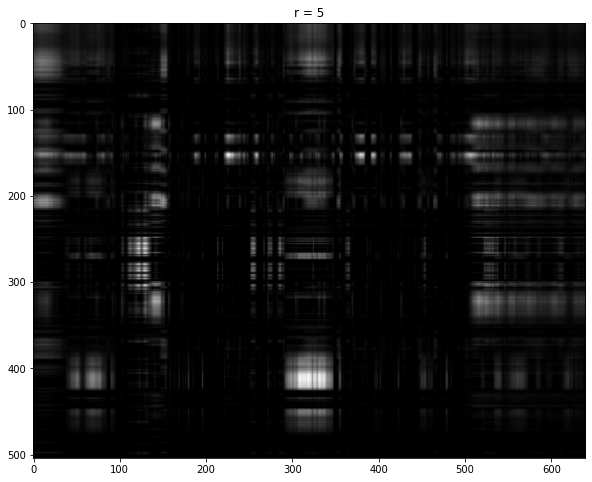

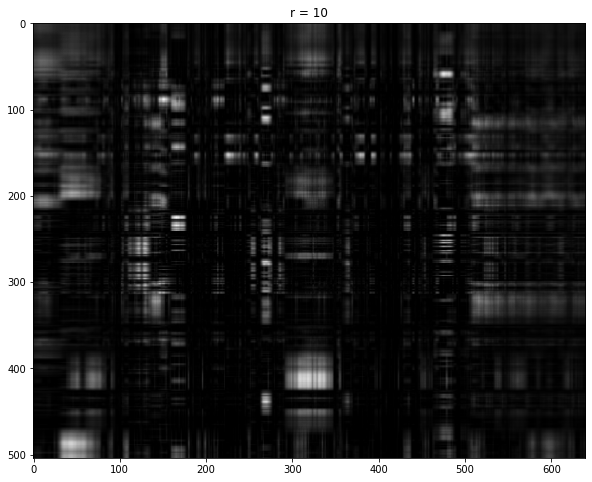

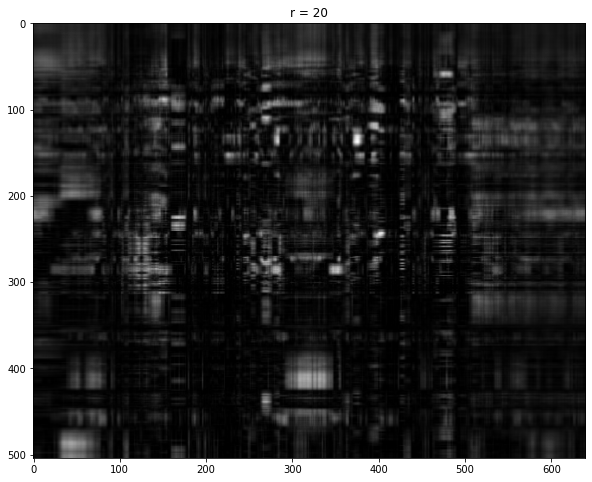

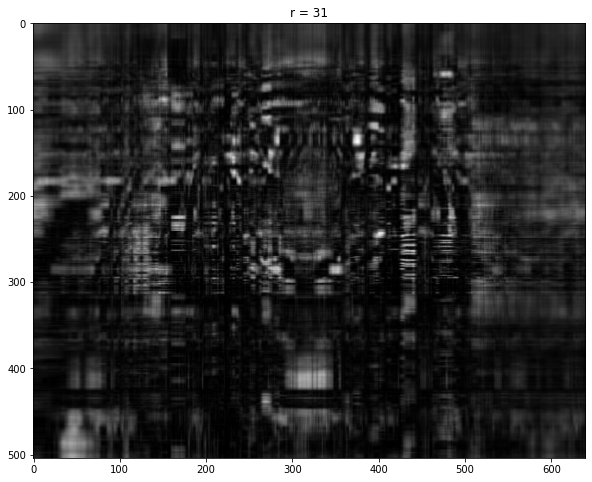

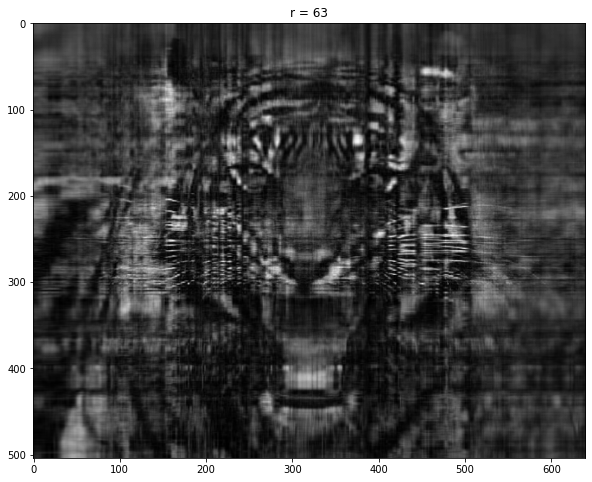

In [ ]:
#@title
for r in (5, 10, 20, int(k_medrank_nmf/4), int(k_medrank_nmf/2)):
    # Construct approximate image
    Xapprox = Wtest_fullNMF[:,:r] @ Htest_fullNMF[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
#     plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()

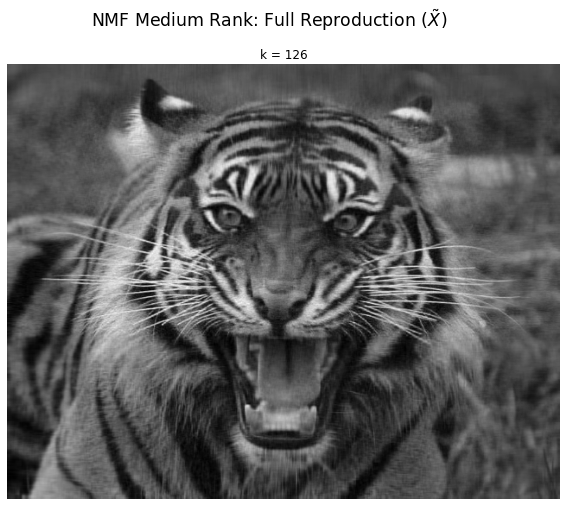

In [ ]:
#@title
#Full rank Reproduction
Reproduced_NMFmedium = Wtest_fullNMF@Htest_fullNMF


img = plt.imshow(Reproduced_NMFmedium)
img.set_cmap('gray')
plt.axis('off')
plt.suptitle('NMF Medium Rank: Full Reproduction $ (\~X) $', fontsize = 'xx-large')
plt.title('k = ' + str(k_medrank_nmf))
plt.show()

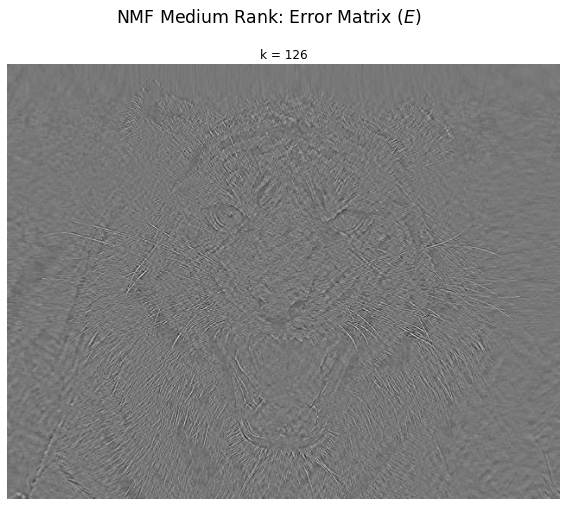

In [ ]:
#@title
#NMR Medium Matrix Error


img = plt.imshow(X - Reproduced_NMFmedium)
img.set_cmap('gray')
plt.axis('off')
plt.suptitle('NMF Medium Rank: Error Matrix $ (E) $', fontsize = 'xx-large')
plt.title('k = ' + str(k_medrank_nmf))
plt.show()

### Ok, this actually is starting to look like the original image, though we can still see structure in the Error Matrix.

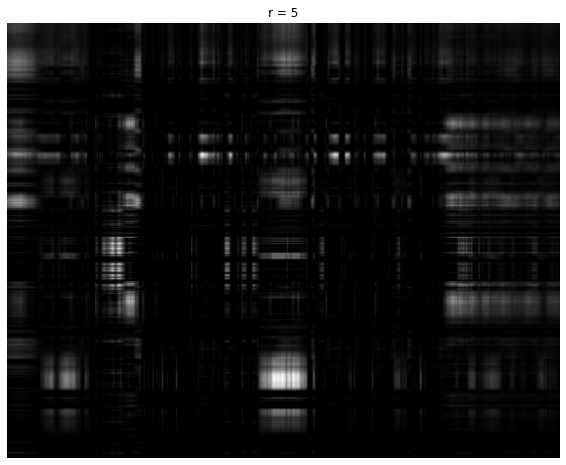

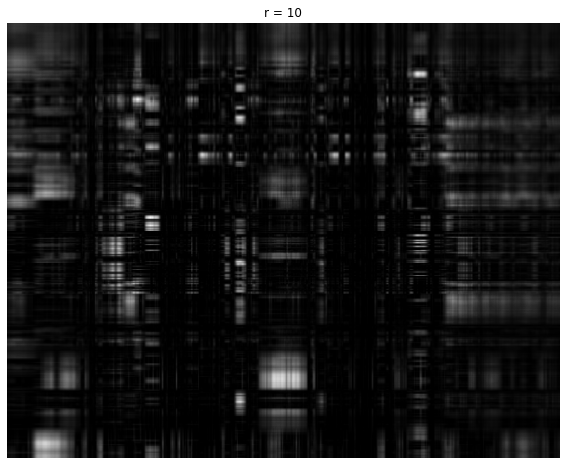

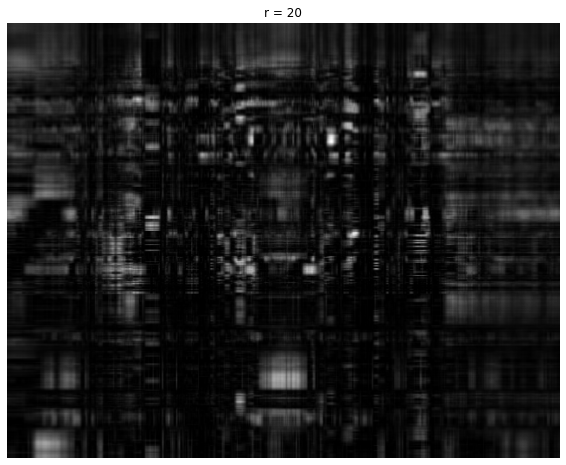

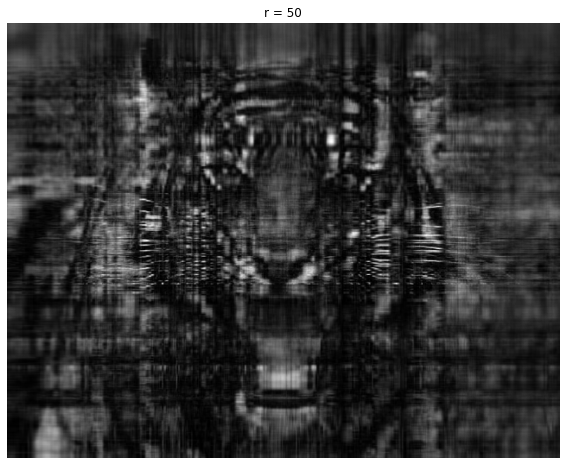

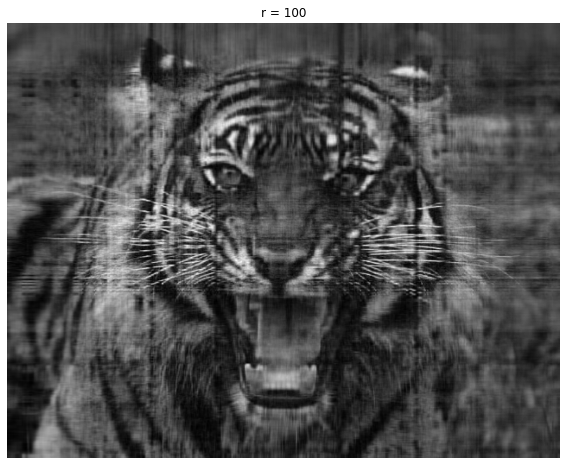

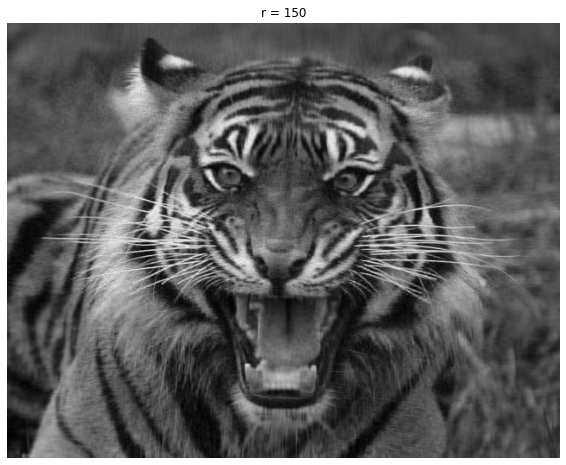

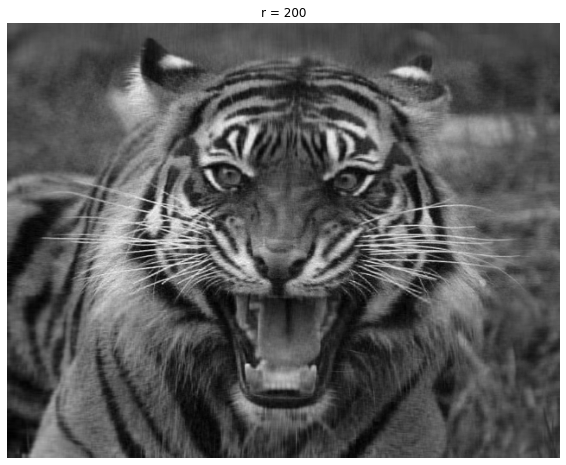

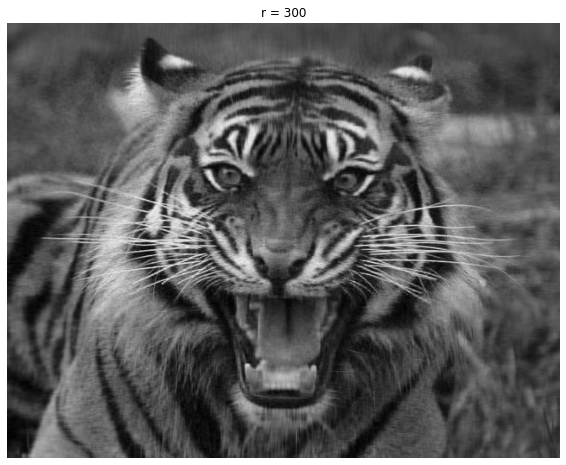

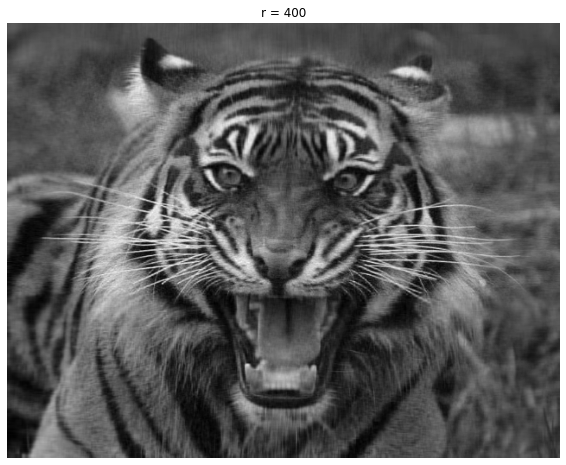

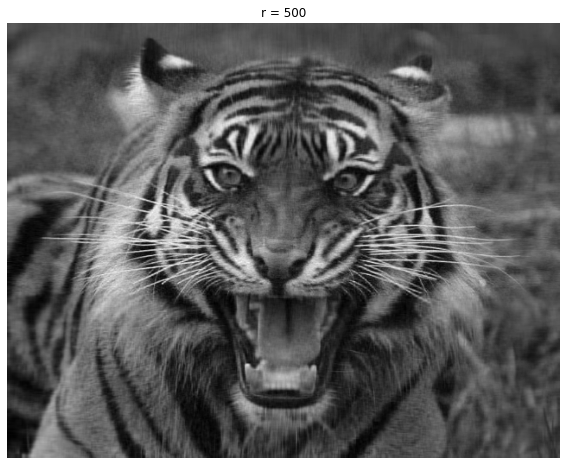

In [ ]:
#@title
Wtest, Htest = SklearnNMF(X, 200, solver_mode = "cd", init_mode = 'nndsvd')

for r in (5, 10, 20, 50, 100, 150, 200, 300, 400, 500):
    # Construct approximate image
    Xapprox = Wtest_fullNMF[:,:r] @ Htest_fullNMF[:r,:]
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    img.set_cmap('gray')
    plt.axis('off')
    plt.title('r = ' + str(r))
    plt.show()

## III. Rank Choice for NMF

#### A. Checking Norm of W

<p> Had this idea to check the "energetic" contribution of the "eigentriples", similar to cumulatve SVD in part II.<p> 

<p> $ \frac{\sum_{i}^{r}W_{i}}{\sum_{i}^{n}W_{i}} $ <p>
    
<p> Hypothesis: this cumulative "energetic" ratio can help choose<p>
    
 Our data is not "noiser" in any sense than this tiger photo.

In [ ]:
Wtest.shape

(504, 200)

In [ ]:
Htest.shape

(200, 640)

In [ ]:
Wn = Wtest.shape[1]
print(Wn)

In [ ]:
#Make an array for graphing, Make a complete reproduction
R = [0]*Wn
x_data = list(range(0,len(R)))
Reproduced = Wtest@Htest


In [ ]:
#Have a look

img = plt.imshow(Reproduced)

img.set_cmap('gray')


plt.axis('off')

plt.suptitle('"Full Rank NMF": Full Reproduction ', fontsize = 'xx-large')
plt.title('r = ' + str()
plt.show()